# Directory

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd '/content/drive/MyDrive/Thesis/'

/content/drive/MyDrive/Thesis


In [3]:
import torch

def get_device():
    """
    Returns the available device ('cuda', 'mps', or 'cpu').
    """
    if torch.cuda.is_available():
        return 'cuda'
    elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        return 'mps'
    else:
        return 'cpu'

device = get_device()
print('Device in use:', device)

Device in use: cuda


# Libraries

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import functools
# For the neural networks
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
# For working with images
from PIL import Image
import io
from IPython.display import Image as IPImage, display

# MNIST Dataset

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader


transform = transforms.Compose([
    transforms.Resize(32),
    transforms.CenterCrop(32),
    transforms.ToTensor(),
    # transforms.Lambda(lambda x: x.clamp(0, 1))
    transforms.Normalize((0.1307,), (0.3081,))
])

# Load the MNIST dataset
mnist_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
mnist_loader = torch.utils.data.DataLoader(mnist_dataset, batch_size=64, shuffle=True)

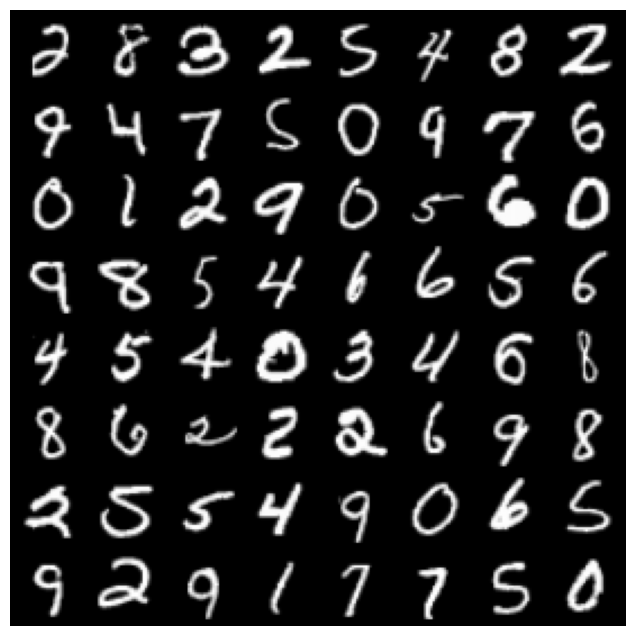

In [ ]:
# Get one batch of 64 images
images, _ = next(iter(mnist_loader))

# Create a 6x6 grid
grid = make_grid(images, nrow=8, padding=2)

# Plot the grid using matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
plt.axis('off')
plt.show()

## VP SDE

### Unconditional

#### Training

In [ ]:
import math

def match_last_dims(data, shape):
    """
    Repeat a 1D tensor so that its last dimensions [1:] match `size[1:]`.
    Useful for working with batched data.
    """
    assert len(data.shape) == 1, "Data must be 1-dimensional (one value per batch)"
    for _ in range(len(shape) - 1):
        data = data.unsqueeze(-1)
    return data.repeat(1, *(shape[1:]))

def compute_beta_t(t_norm, T, schedule = 'linear'):
    # Compute β(t) depending on schedule.
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        beta_t = beta_min + t_norm * (beta_max - beta_min)
    elif schedule == 'cosine':
        s = 0.008
        beta_t = (torch.pi / (T * (1 + s))) * torch.tan(((t_norm + s) / (1 + s)) * (torch.pi / 2))
    else:
        raise ValueError('Unknown schedule')
    return beta_t

def compute_alpha_bar(t_norm, schedule = 'linear'):
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        integrated_beta = beta_min * t_norm + 0.5 * (beta_max - beta_min) * t_norm**2
        alpha_bar = torch.exp(-  integrated_beta)
    elif schedule == 'cosine':
        alpha_bar = 0.5 * (1 - torch.cos(t_norm * torch.pi))
        s = 0.008
        alpha_bar = torch.cos((t_norm + s) / (1 + s) * (torch.pi / 2))**2
    else:
        raise ValueError('Unknown schedule')
    return alpha_bar

# must return x_t and the added noise, we will need it later to compute the loss
def forward(x_start, t, T, schedule = 'linear'):
    t_norm = t / T
    alpha_bar = compute_alpha_bar(t_norm, schedule)
    # expand alpha_bar to the same shape as x_start, so that we can multiply them
    alpha_bar = match_last_dims(alpha_bar, x_start.shape)
    noise = torch.randn_like(x_start)
    x_t = torch.sqrt(alpha_bar)*x_start + torch.sqrt(1 - alpha_bar)*noise
    return x_t, noise

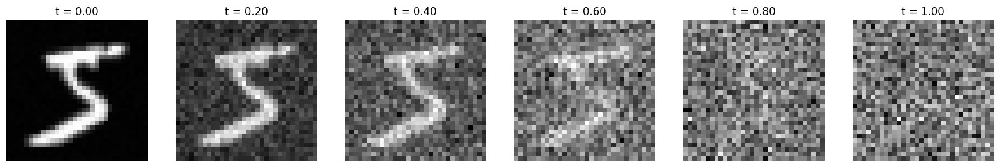

In [ ]:
x_start, _ = mnist_dataset[0]  # Get the first image
x_start = x_start.unsqueeze(0).to(device)  # Add batch dimension and move to device

# plot the empirical marginals p_t
def plot_ax_i(ax, x_t, title):
    ax.imshow(x_t[0].cpu().numpy(), cmap='gray')
    ax.axis('off')
    ax.set_title(title)

# Plot forward process at different timesteps
fig, axs = plt.subplots(1, 6, figsize=(20, 5))
T = 5
for i, t_norm in enumerate([0.0, 0.2, 0.4, 0.6, 0.8, 1]):
    t = t_norm * T * torch.ones(x_start.shape[0], device=device)
    x_t, _ = forward(x_start, t, T, schedule='cosine')
    plot_ax_i(axs[i], x_t[:, 0], f"t = {t_norm:.2f}")
plt.show()

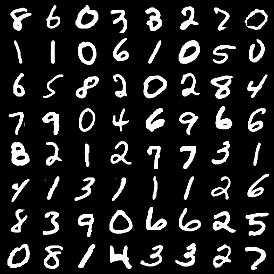

In [ ]:
# Get a batch of 32 images
x_start, _ = next(iter(mnist_loader))
x_start = x_start.to(device)

# Parameters
T = 30  # Total number of time steps
num_images = 30  # Number of images in the GIF
stepsize = int(T / num_images)  # Step size for time

# def plot_gif(ax, x_t):

result = []
for i, t in enumerate(range(0, T, stepsize)):
    t_norm = t / T
    t = t_norm * T * torch.ones(x_start.shape[0], device=device)
    x_t, _ = forward(x_start, t, T)
    grid = make_grid(x_t, nrow=8, padding=2).permute(1, 2, 0).cpu().numpy()  # Create a grid
    grid = (np.clip(grid, 0, 1) * 255).astype(np.uint8)  # Normalize and convert to uint8
    result.append(Image.fromarray(grid))  # Store as a frame

# Create GIF
buf = io.BytesIO()
result[0].save(buf, format="GIF", append_images=result[1:], save_all=True, duration=100, loop=0)
buf.seek(0)

# Save GIF locally
output_path = "diffusion_simulation_grid.gif"
result[0].save(output_path, format="GIF", append_images=result[1:], save_all=True, duration=100, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

In [ ]:
import torch.nn.functional as F

def noise_loss(model, x_start, T):
    x_start = x_start.to(device)
    batch_size = x_start.shape[0]
    # Sample t uniformly from [0, T]
    t = torch.rand(batch_size, device=device) * T
    x_t, noise = forward(x_start, t, T)
    # The model takes x_t and t as input and predicts the noise. time t should be of shape (batch_size, 1)
    # we can pass normalized time to model as input
    t_norm = t / T
    predicted_noise = model(x_t, t_norm)
    loss = F.mse_loss(predicted_noise, noise)
    return loss

In [ ]:
from utils.unet import UNetModel

channels = 1
out_channels = 1

first_layer_embedding = False
embedding_dim = 3 # MD4 needs a value for masks, so set of values is {0, 1, 2}
output_dim = 1 # We only output a single probability value

model = UNetModel(
        in_channels=channels,
        model_channels=32,
        out_channels= out_channels,
        num_res_blocks=2,
        attention_resolutions= [2, 4],# tuple([2, 4]), # adds attention at image_size / 2 and /4
        dropout= 0.1,
        channel_mult= [1, 2, 2, 2], # divides image_size by two at each new item, except first one. [i] * model_channels
        dims = 2, # for images
        num_classes= None,#
        num_heads=4,
        num_heads_upsample=-1, # same as num_heads
        use_scale_shift_norm=True,
        first_layer_embedding=first_layer_embedding,
        embedding_dim= embedding_dim,
        output_dim = output_dim,
    )

model = model.to(device)

In [ ]:
# setting up the optimizer
import torch.optim as optim

optimizer = optim.AdamW(
    model.parameters(),
    lr=2e-3,
    betas=(0.9, 0.999))

In [ ]:
import os

def train(num_epochs, dataloader, model, optimizer, checkpoint_dir, device, T = 1):
    print("Training on device:", device)

    # Set the model to training mode.
    model.train()

    epoch_losses = []
    for epoch in (range(1, num_epochs + 1)):

        running_loss = 0.0

        for batch_idx, (data, _) in (enumerate(dataloader)):
            data = data.to(device)
            optimizer.zero_grad()

            # Compute the training loss.
            loss = noise_loss(model, x_start=data, T=T)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        epoch_losses.append(avg_loss)
        print(f"Epoch [{epoch}] Average Loss: {avg_loss:.4f}")

    print("Training finished.")

    # Save the losses to a file
    loss_path = os.path.join(checkpoint_dir, "VP_unconditioned.pt")
    torch.save(epoch_losses, loss_path)
    print(f"Saved losses to: {loss_path}")

    # Plotting the loss
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, num_epochs + 1), epoch_losses, label="Loss", color="blue")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Over Epochs")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Training on device: cuda
Epoch [1] Average Loss: 0.0381
Epoch [2] Average Loss: 0.0256
Epoch [3] Average Loss: 0.0238
Epoch [4] Average Loss: 0.0227
Training finished.
Saved losses to: checkpoints/VP_unconditioned.pt


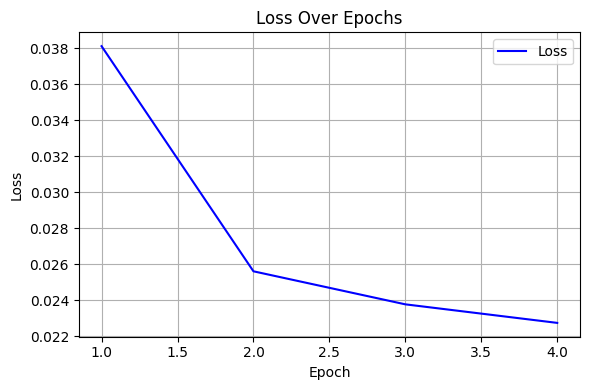

In [ ]:
train(
    num_epochs=4,
    dataloader=mnist_loader,
    model=model,
    optimizer=optimizer,
    checkpoint_dir="checkpoints",
    device = device
)

In [ ]:
# Save model weights
torch.save(model.state_dict(), "trained/VP_unconditioned.pth")

#### Generation - Deterministic

In [ ]:
model.load_state_dict(torch.load("trained/VP_unconditioned.pth"))

<All keys matched successfully>

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 1, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)


            # Get the score (using the noise-predicting network)
            score = score_fn(model, xt, t_batch)

            # Euler–Maruyama update:
            xt = xt + (f - (g**2) * score / 2) * dt


            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 500/500 [00:21<00:00, 23.66it/s]
<ipython-input-15-b297dea5b446>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


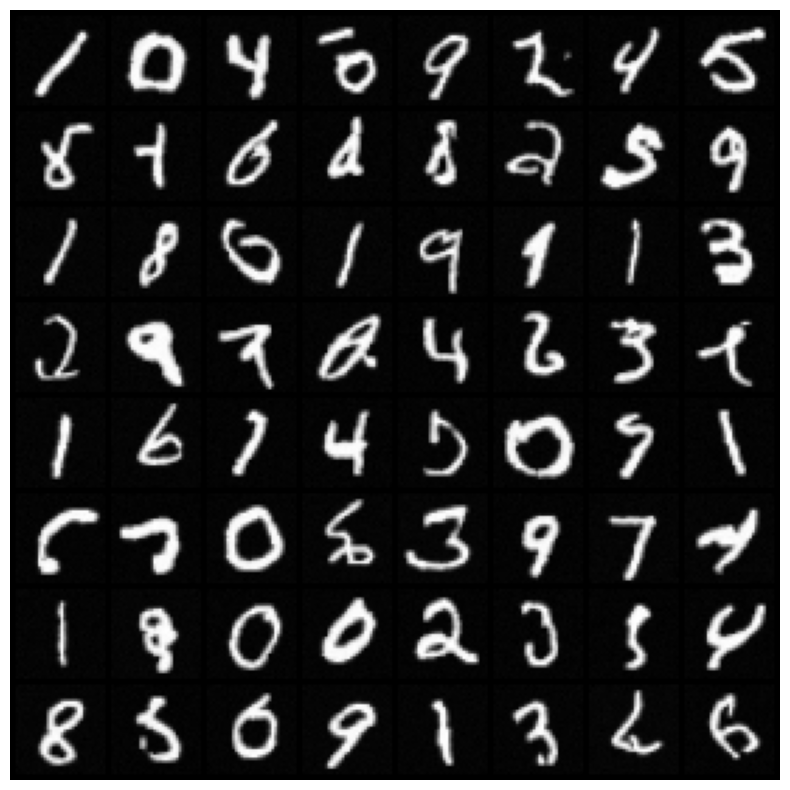

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=500,
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=4,
    reverse_steps=500,
    schedule='linear',
    T=1,
    gif=True
)

frames = []
for _, x_t in enumerate(samples):
    frame = make_grid(x_t, nrow=2, padding=2).permute(1, 2, 0).cpu().numpy()
    frame = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    frames.append(Image.fromarray(frame))

# Create GIF
buf = io.BytesIO()
frames[0].save(buf, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)
buf.seek(0)

# # Save GIF locally
# output_path = "unconditioned.gif"
# frames[0].save(output_path, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

Output hidden; open in https://colab.research.google.com to view.

#### Evaluation - Stochastic

In [ ]:
model.load_state_dict(torch.load("trained/VP_unconditioned.pth"))

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 1, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)


            # Get the score (using the noise-predicting network)
            score = score_fn(model, xt, t_batch)

            # Euler–Maruyama update:
            #   x = x + [f - g^2 * score] dt + g * sqrt(-dt) * z,   where z ~ N(0, I)
            z = torch.randn_like(xt)

            xt = xt + (f - (g**2) * score) * dt + g * torch.sqrt(-dt) * z

            all_images.append(xt)

    return xt if not gif else all_images

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    steps=500,
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=4,
    reverse_steps=500,
    schedule='linear',
    T=1,
    gif=True
)

# final_step_images = [s[-1].cpu().detach().numpy() for s in samples]

frames = []
for _, x_t in enumerate(samples):
    frame = make_grid(x_t, nrow=2, padding=2).permute(1, 2, 0).cpu().numpy()
    frame = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    frames.append(Image.fromarray(frame))

# Create GIF
buf = io.BytesIO()
frames[0].save(buf, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)
buf.seek(0)

# # Save GIF locally
# output_path = "unconditioned.gif"
# frames[0].save(output_path, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

### Conditional

#### Training

In [ ]:
import math

def match_last_dims(data, shape):
    """
    Repeat a 1D tensor so that its last dimensions [1:] match `size[1:]`.
    Useful for working with batched data.
    """
    assert len(data.shape) == 1, "Data must be 1-dimensional (one value per batch)"
    for _ in range(len(shape) - 1):
        data = data.unsqueeze(-1)
    return data.repeat(1, *(shape[1:]))

def compute_beta_t(t_norm, T, schedule = 'linear'):
    # Compute β(t) depending on schedule.
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        beta_t = beta_min + t_norm * (beta_max - beta_min)
    elif schedule == 'cosine':
        s = 0.008
        beta_t = (torch.pi / (T * (1 + s))) * torch.tan(((t_norm + s) / (1 + s)) * (torch.pi / 2))
    else:
        raise ValueError('Unknown schedule')
    return beta_t

def compute_alpha_bar(t_norm, schedule = 'linear'):
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        integrated_beta = beta_min * t_norm + 0.5 * (beta_max - beta_min) * t_norm**2
        alpha_bar = torch.exp(-  integrated_beta)
    elif schedule == 'cosine':
        alpha_bar = 0.5 * (1 - torch.cos(t_norm * torch.pi))
        s = 0.008
        alpha_bar = torch.cos((t_norm + s) / (1 + s) * (torch.pi / 2))**2
    else:
        raise ValueError('Unknown schedule')
    return alpha_bar

# must return x_t and the added noise, we will need it later to compute the loss
def forward(x_start, t, T, schedule = 'linear'):
    t_norm = t / T
    alpha_bar = compute_alpha_bar(t_norm, schedule)
    # expand alpha_bar to the same shape as x_start, so that we can multiply them
    alpha_bar = match_last_dims(alpha_bar, x_start.shape)
    noise = torch.randn_like(x_start)
    x_t = torch.sqrt(alpha_bar)*x_start + torch.sqrt(1 - alpha_bar)*noise
    return x_t, noise

In [ ]:
import torch.nn.functional as F

def noise_loss(model, x_start, T, y):
    x_start = x_start.to(device)
    batch_size = x_start.shape[0]
    # Sample t uniformly from [0, T]
    t = torch.rand(batch_size, device=device) * T
    x_t, noise = forward(x_start, t, T)
    # The model takes x_t and t as input and predicts the noise. time t should be of shape (batch_size, 1)
    # we can pass normalized time to model as input
    t_norm = t / T

    predicted_noise = model(x_t, t_norm, y=y)
    loss = F.mse_loss(predicted_noise, noise)
    return loss

In [ ]:
from utils.unet import UNetModel

channels = 1
out_channels = 1

first_layer_embedding = False
embedding_dim = 3 # MD4 needs a value for masks, so set of values is {0, 1, 2}
output_dim = 1 # We only output a single probability value

model = UNetModel(
        in_channels=channels,
        model_channels=32,
        out_channels= out_channels,
        num_res_blocks=2,
        attention_resolutions= [2, 4],# tuple([2, 4]), # adds attention at image_size / 2 and /4
        dropout= 0.1,
        channel_mult= [1, 2, 2, 2], # divides image_size by two at each new item, except first one. [i] * model_channels
        dims = 2, # for images
        num_classes= 10,
        num_heads=4,
        num_heads_upsample=-1, # same as num_heads
        use_scale_shift_norm=True,
        first_layer_embedding=first_layer_embedding,
        embedding_dim= embedding_dim,
        output_dim = output_dim,
    )

model = model.to(device)

In [ ]:
# setting up the optimizer
import torch.optim as optim

optimizer = optim.AdamW(
    model.parameters(),
    lr=2e-3,
    betas=(0.9, 0.999))

In [ ]:
import os

def train(num_epochs, dataloader, model, optimizer, checkpoint_dir, device, T = 1):
    print("Training on device:", device)

    # Set the model to training mode.
    model.train()

    epoch_losses = []
    for epoch in (range(1, num_epochs + 1)):

        running_loss = 0.0

        for batch_idx, (data, y) in (enumerate(dataloader)):
            data = data.to(device)
            y = y.to(device)
            optimizer.zero_grad()

            # Compute the training loss.
            loss = noise_loss(model, x_start=data, T=T, y=y.int())
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        epoch_losses.append(avg_loss)
        print(f"Epoch [{epoch}] Average Loss: {avg_loss:.4f}")

    print("Training finished.")

    # Save the losses to a file
    loss_path = os.path.join(checkpoint_dir, "VP_conditioned.pt")
    torch.save(epoch_losses, loss_path)
    print(f"Saved losses to: {loss_path}")

    # Plotting the loss
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, num_epochs + 1), epoch_losses, label="Loss", color="blue")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Over Epochs")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Training on device: cuda
Epoch [1] Average Loss: 0.0381
Epoch [2] Average Loss: 0.0248
Epoch [3] Average Loss: 0.0230
Epoch [4] Average Loss: 0.0224
Epoch [5] Average Loss: 0.0217
Epoch [6] Average Loss: 0.0214
Epoch [7] Average Loss: 0.0210
Epoch [8] Average Loss: 0.0209
Epoch [9] Average Loss: 0.0207
Epoch [10] Average Loss: 0.0206
Epoch [11] Average Loss: 0.0204
Epoch [12] Average Loss: 0.0203
Epoch [13] Average Loss: 0.0201
Epoch [14] Average Loss: 0.0202
Epoch [15] Average Loss: 0.0198
Epoch [16] Average Loss: 0.0200
Epoch [17] Average Loss: 0.0198
Epoch [18] Average Loss: 0.0198
Epoch [19] Average Loss: 0.0199
Epoch [20] Average Loss: 0.0195
Epoch [21] Average Loss: 0.0195
Epoch [22] Average Loss: 0.0196
Epoch [23] Average Loss: 0.0194
Epoch [24] Average Loss: 0.0195
Epoch [25] Average Loss: 0.0195
Epoch [26] Average Loss: 0.0194
Epoch [27] Average Loss: 0.0195
Epoch [28] Average Loss: 0.0194
Epoch [29] Average Loss: 0.0193
Epoch [30] Average Loss: 0.0195
Epoch [31] Average Loss:

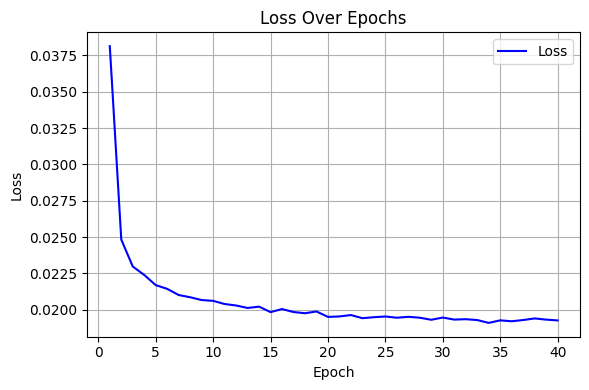

In [ ]:
train(
    num_epochs=40,
    dataloader=mnist_loader,
    model=model,
    optimizer=optimizer,
    checkpoint_dir="checkpoints",
    device = device
)

In [ ]:
# Save model weights
torch.save(model.state_dict(), "trained/VP_conditioned.pth")

#### Evaluation - Deterministic

In [ ]:
model.load_state_dict(torch.load("trained/VP_conditioned.pth"))

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm, y):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm, y)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, class_label, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 1, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)

            # Compute conditional score
            cond_class_label = torch.full((shape[0],), class_label, device=device)
            score_cond = score_fn(model, xt, t_batch, cond_class_label)

            # Euler–Maruyama update:
            xt = xt + (f - (g**2) * score_cond / 2) * dt

            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 500/500 [00:22<00:00, 22.41it/s]
<ipython-input-25-d289f1f8ffbb>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


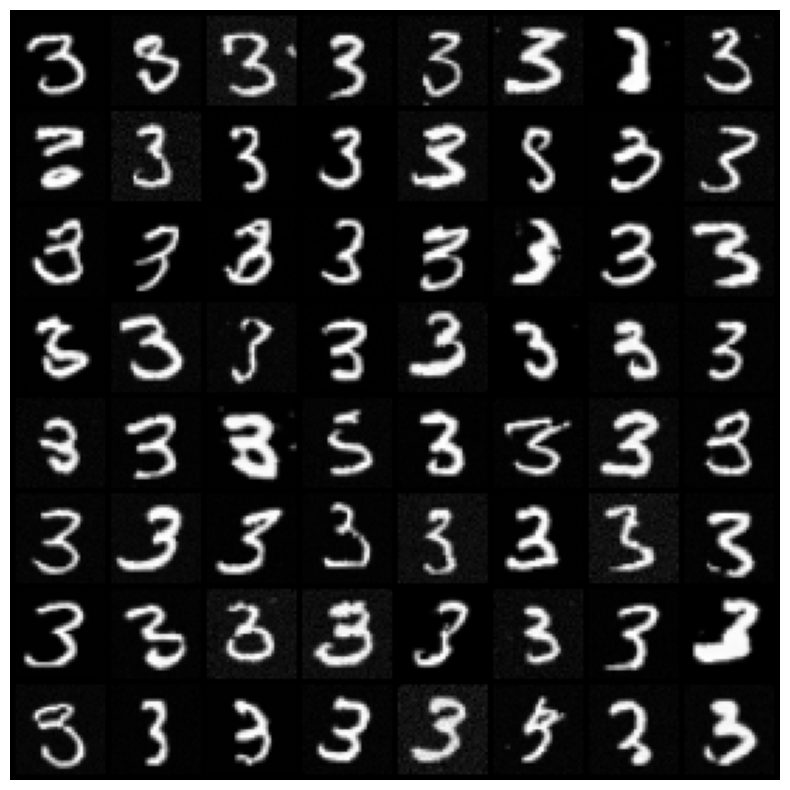

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=500,
    class_label=3,
    schedule='linear',
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 500/500 [00:12<00:00, 38.82it/s]
<ipython-input-15-9d42438f6d02>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
100%|██████████| 500/500 [00:12<00:00, 38.55it/s]


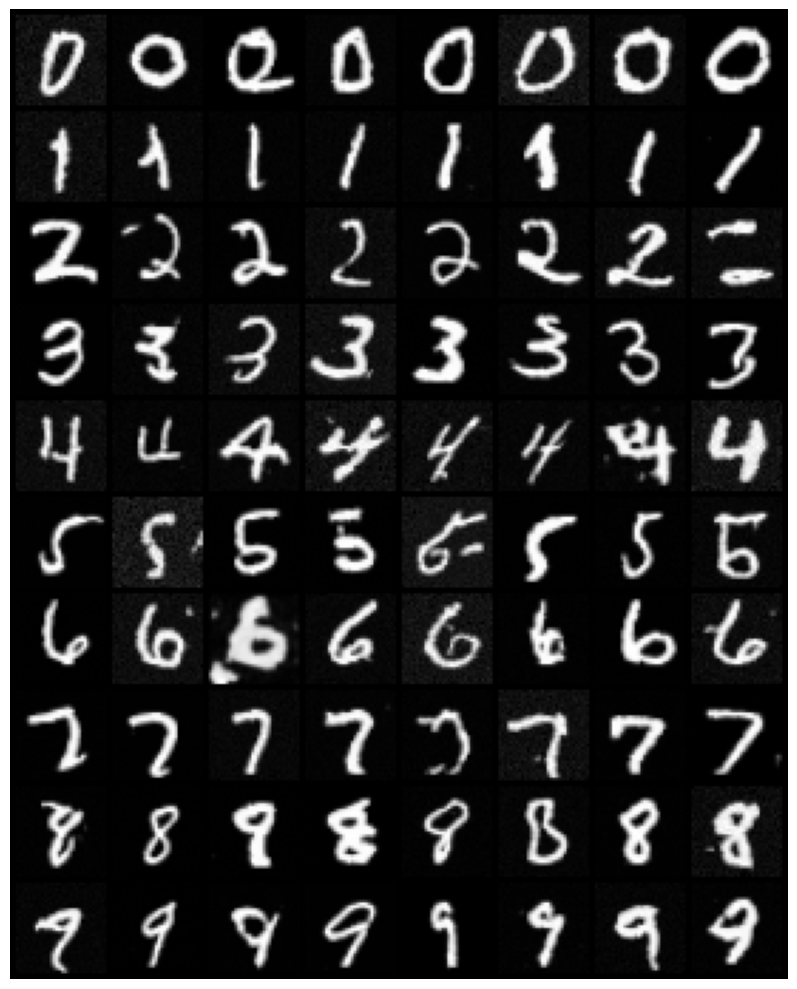

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Initialize an empty list to store all samples
all_samples = []

# Loop over digit classes 0 through 9
for class_label in range(10):
    samples = sample(
        model=model,
        n_samples=8,
        reverse_steps=500,
        class_label=class_label,
        T=1,
        gif=False
    )

    # Stack and collect final step images
    final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
    all_samples.append(final_step_images)

# Concatenate all class sample tensors into one tensor of shape (80, C, H, W)
all_samples_tensor = torch.cat(all_samples, dim=0)

# Create a grid with 8 rows and 10 columns
grid = make_grid(all_samples_tensor, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(12, 10))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 50/50 [00:01<00:00, 41.95it/s]
<ipython-input-26-a695c7965747>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sampled_images.append(torch.tensor(sample_result[0]).cpu())
100%|██████████| 500/500 [00:12<00:00, 38.51it/s]


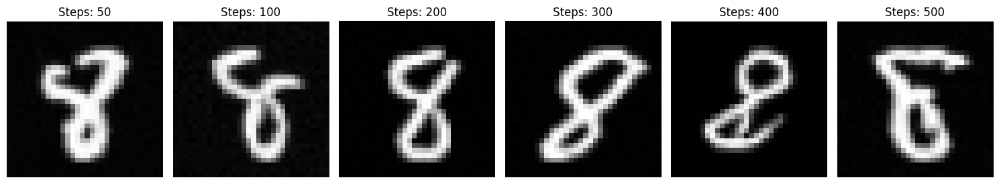

In [ ]:
import matplotlib.pyplot as plt
import torch

# List of steps at which to sample
steps_list = [50, 100, 200, 300, 400, 500]

# Collect one sample for each specified step count
sampled_images = []
for steps in steps_list:
    sample_result = sample(
        model=model,
        n_samples=1,
        reverse_steps=steps,
        class_label=8,
        T=1,
        gif=False
    )
    # Assume sample returns a list of numpy arrays or tensors
    sampled_images.append(torch.tensor(sample_result[0]).cpu())

# Plot each image individually
plt.figure(figsize=(15, 3))
for idx, image in enumerate(sampled_images):
    plt.subplot(1, len(steps_list), idx + 1)
    plt.imshow(image.squeeze(), cmap='gray')
    plt.title(f'Steps: {steps_list[idx]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

#### Evaluation - Stochastic

In [ ]:
model.load_state_dict(torch.load("trained/VP_conditioned.pth"))

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm, y):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm, y)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, class_label, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 1, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)

            # Compute conditional score
            cond_class_label = torch.full((shape[0],), class_label, device=device)
            score_cond = score_fn(model, xt, t_batch, cond_class_label)

            # Euler–Maruyama update:
            #   x = x + [f - g^2 * score] dt + g * sqrt(-dt) * z,   where z ~ N(0, I)
            z = torch.randn_like(xt)

            xt = xt + (f - (g**2) * score_cond) * dt + g * torch.sqrt(-dt) * z

            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 500/500 [00:22<00:00, 22.67it/s]
<ipython-input-21-d289f1f8ffbb>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


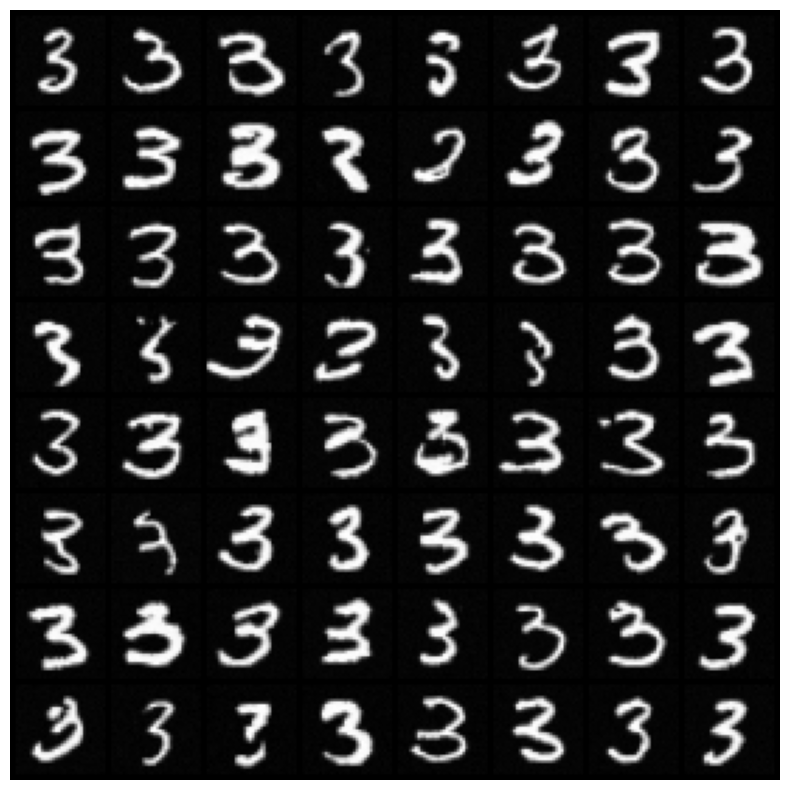

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=500,
    class_label=3,
    schedule='linear',
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 500/500 [00:14<00:00, 35.66it/s]
<ipython-input-22-9d42438f6d02>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
100%|██████████| 500/500 [00:17<00:00, 28.96it/s]


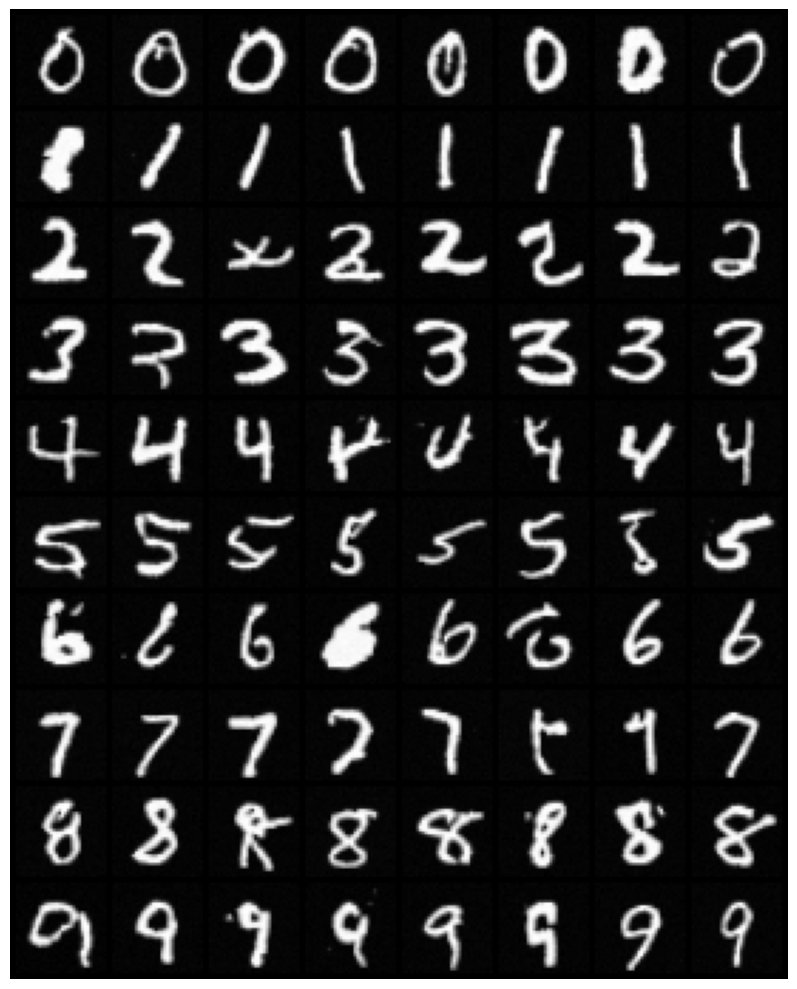

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Initialize an empty list to store all samples
all_samples = []

# Loop over digit classes 0 through 9
for class_label in range(10):
    samples = sample(
        model=model,
        n_samples=4,
        reverse_steps=500,
        class_label=class_label,
        T=1,
        gif=False
    )

    # Stack and collect final step images
    final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
    all_samples.append(final_step_images)

# Concatenate all class sample tensors into one tensor of shape (10 * n_sample, C, H, W)
all_samples_tensor = torch.cat(all_samples, dim=0)

# Create a grid with 8 rows and 10 columns
grid = make_grid(all_samples_tensor, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(12, 10))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 50/50 [00:01<00:00, 41.86it/s]
<ipython-input-23-a695c7965747>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sampled_images.append(torch.tensor(sample_result[0]).cpu())
100%|██████████| 500/500 [00:14<00:00, 34.48it/s]


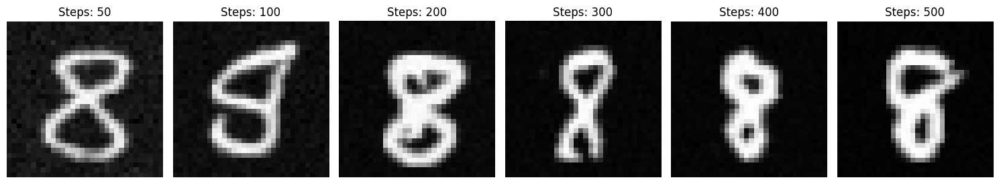

In [ ]:
import matplotlib.pyplot as plt
import torch

# List of steps at which to sample
steps_list = [50, 100, 200, 300, 400, 500]

# Collect one sample for each specified step count
sampled_images = []
for steps in steps_list:
    sample_result = sample(
        model=model,
        n_samples=1,
        reverse_steps=steps,
        class_label=8,
        T=1,
        gif=False
    )
    # Assume sample returns a list of numpy arrays or tensors
    sampled_images.append(torch.tensor(sample_result[0]).cpu())

# Plot each image individually
plt.figure(figsize=(15, 3))
for idx, image in enumerate(sampled_images):
    plt.subplot(1, len(steps_list), idx + 1)
    plt.imshow(image.squeeze(), cmap='gray')
    plt.title(f'Steps: {steps_list[idx]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

# CIFAR10

In [5]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Tranformation for the CIFAR10
# transform = transforms.Compose([
#     transforms.ToTensor(),
#     transforms.Lambda(lambda x: x.clamp(0, 1))
# ])

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4914, 0.4822, 0.4465],
                         std=[0.2470, 0.2435, 0.2616])
])

# Download the dataset
cifar10_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
cifar10_loader = DataLoader(cifar10_dataset, batch_size=64, shuffle=True)

CLASSES = (
    "plane",
    "car",
    "bird",
    "cat",
    "deer",
    "dog",
    "frog",
    "horse",
    "ship",
    "truck",
)

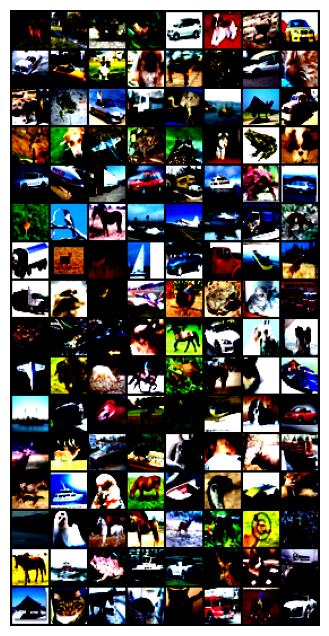

In [ ]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Take the first batch of 64 images
images, _ = next(iter(cifar10_loader))

# Create a grid 8x8
grid = make_grid(images, nrow=8, padding=2)

# Show the plot
plt.figure(figsize=(8, 8))
plt.imshow(grid.clamp(0,1).permute(1, 2, 0))
plt.axis('off')
plt.show()

In [6]:
import math

def match_last_dims(data, shape):
    """
    Repeat a 1D tensor so that its last dimensions [1:] match `size[1:]`.
    Useful for working with batched data.
    """
    assert len(data.shape) == 1, "Data must be 1-dimensional (one value per batch)"
    for _ in range(len(shape) - 1):
        data = data.unsqueeze(-1)
    return data.repeat(1, *(shape[1:]))

def compute_beta_t(t_norm, T, schedule = 'linear'):
    # Compute β(t) depending on schedule.
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        beta_t = beta_min + t_norm * (beta_max - beta_min)
    elif schedule == 'cosine':
        s = 0.008
        beta_t = (torch.pi / (T * (1 + s))) * torch.tan(((t_norm + s) / (1 + s)) * (torch.pi / 2))
    else:
        raise ValueError('Unknown schedule')
    return beta_t

def compute_alpha_bar(t_norm, schedule = 'linear'):
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        integrated_beta = beta_min * t_norm + 0.5 * (beta_max - beta_min) * t_norm**2
        alpha_bar = torch.exp(-  integrated_beta)
    elif schedule == 'cosine':
        s = 0.008
        alpha_bar = torch.cos((t_norm + s) / (1 + s) * (torch.pi / 2))**2
    else:
        raise ValueError('Unknown schedule')
    return alpha_bar

# must return x_t and the added noise, we will need it later to compute the loss
def forward(x_start, t, T, schedule = 'cosine'):
    t_norm = t / T
    alpha_bar = compute_alpha_bar(t_norm, schedule)
    # expand alpha_bar to the same shape as x_start, so that we can multiply them
    alpha_bar = match_last_dims(alpha_bar, x_start.shape)
    noise = torch.randn_like(x_start)
    x_t = torch.sqrt(alpha_bar)*x_start + torch.sqrt(1 - alpha_bar)*noise
    return x_t, noise

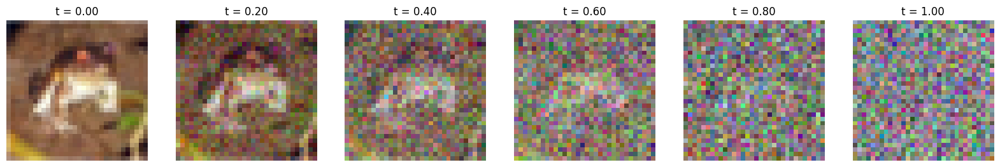

In [ ]:
x_start, _ = cifar10_dataset[0]  # Get the first image
x_start = x_start.unsqueeze(0).to(device)  # Add batch dimension and move to device

# plot the empirical marginals p_t
def plot_ax_i(ax, x_t, title):
    img = x_t.cpu()
    img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0, 1]
    ax.imshow(img.permute(1, 2, 0).numpy())
    ax.axis('off')
    ax.set_title(title)


# Plot forward process at different timesteps
fig, axs = plt.subplots(1, 6, figsize=(20, 5))
T = 5
for i, t_norm in enumerate([0.0, 0.2, 0.4, 0.6, 0.8, 1]):
    t = t_norm * T * torch.ones(x_start.shape[0], device=device)
    x_t, _ = forward(x_start, t, T, schedule='cosine')
    plot_ax_i(axs[i], x_t[0], f"t = {t_norm:.2f}")

plt.show()

In [ ]:
# Get a batch of 32 images
x_start, _ = next(iter(cifar10_loader))
x_start = x_start.to(device)

# Parameters
T = 30  # Total number of time steps
num_images = 30  # Number of images in the GIF
stepsize = int(T / num_images)  # Step size for time

result = []
for i, t in enumerate(range(0, T, stepsize)):
    t_norm = t / T
    t = t_norm * T * torch.ones(x_start.shape[0], device=device)
    x_t, _ = forward(x_start, t, T)
    grid = make_grid(x_t, nrow=8, padding=2).permute(1, 2, 0).cpu().numpy()  # Create a grid
    grid = (np.clip(grid, 0, 1) * 255).astype(np.uint8)  # Normalize and convert to uint8
    result.append(Image.fromarray(grid))  # Store as a frame

# Create GIF
buf = io.BytesIO()
result[0].save(buf, format="GIF", append_images=result[1:], save_all=True, duration=100, loop=0)
buf.seek(0)

# # Save GIF locally
# output_path = "diffusion_simulation_grid.gif"
# result[0].save(output_path, format="GIF", append_images=result[1:], save_all=True, duration=100, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

Output hidden; open in https://colab.research.google.com to view.

In [7]:
import torch.nn.functional as F

def noise_loss(model, x_start, T):
    x_start = x_start.to(device)
    batch_size = x_start.shape[0]
    # Sample t uniformly from [0, T]
    t = torch.rand(batch_size, device=device) * T
    x_t, noise = forward(x_start, t, T)
    # The model takes x_t and t as input and predicts the noise. time t should be of shape (batch_size, 1)
    # we can pass normalized time to model as input
    t_norm = t / T
    predicted_noise = model(x_t, t_norm)
    loss = F.mse_loss(predicted_noise, noise)
    return loss

In [12]:
from utils.unet import UNetModel

channels = 3
out_channels = 3 # or 6

first_layer_embedding = False
embedding_dim = 3 # MD4 needs a value for masks, so set of values is {0, 1, 2}
output_dim = 1 # We only output a single probability value
attention_ds = (8,16)

model = UNetModel(
        in_channels=channels,
        model_channels=128,
        out_channels= out_channels,
        num_res_blocks=2,
        attention_resolutions= attention_ds,
        dropout= 0.3,
        channel_mult= (1, 2, 2, 2), # divides image_size by two at each new item, except first one. [i] * model_channels
        dims = 2, # for images
        num_classes= None,#
        num_heads=4,
        num_heads_upsample=-1, # same as num_heads
        use_scale_shift_norm=True,
        first_layer_embedding=first_layer_embedding,
        embedding_dim= embedding_dim,
        output_dim = output_dim
    )

model = model.to(device)

In [13]:
# setting up the optimizer
import torch.optim as optim

optimizer = optim.AdamW(
    model.parameters(),
    lr=1e-4,
    betas=(0.9, 0.999))

In [14]:
import os

def train(num_epochs, dataloader, model, optimizer, checkpoint_dir, device, T = 1):
    print("Training on device:", device)

    # Set the model to training mode.
    model.train()

    epoch_losses = []
    for epoch in (range(1, num_epochs + 1)):

        running_loss = 0.0

        for batch_idx, (data, _) in (enumerate(dataloader)):
            data = data.to(device)
            optimizer.zero_grad()

            # Compute the training loss.
            loss = noise_loss(model, x_start=data, T=T)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        epoch_losses.append(avg_loss)
        print(f"Epoch [{epoch}] Average Loss: {avg_loss:.4f}")

    print("Training finished.")

    # Save the losses to a file
    loss_path = os.path.join(checkpoint_dir, "cifar_VP_unconditioned.pt")
    torch.save(epoch_losses, loss_path)
    print(f"Saved losses to: {loss_path}")

    # Plotting the loss
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, num_epochs + 1), epoch_losses, label="Loss", color="blue")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Over Epochs")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Training on device: cuda
Epoch [1] Average Loss: 0.1588
Epoch [2] Average Loss: 0.1064
Epoch [3] Average Loss: 0.1025
Epoch [4] Average Loss: 0.1006
Epoch [5] Average Loss: 0.0992
Epoch [6] Average Loss: 0.0990
Epoch [7] Average Loss: 0.0982
Epoch [8] Average Loss: 0.0971
Epoch [9] Average Loss: 0.0970
Epoch [10] Average Loss: 0.0963
Epoch [11] Average Loss: 0.0963
Epoch [12] Average Loss: 0.0957
Epoch [13] Average Loss: 0.0954
Epoch [14] Average Loss: 0.0951
Epoch [15] Average Loss: 0.0946
Epoch [16] Average Loss: 0.0944
Epoch [17] Average Loss: 0.0944
Epoch [18] Average Loss: 0.0945
Epoch [19] Average Loss: 0.0945
Epoch [20] Average Loss: 0.0933
Epoch [21] Average Loss: 0.0934
Epoch [22] Average Loss: 0.0945
Epoch [23] Average Loss: 0.0931
Epoch [24] Average Loss: 0.0941
Epoch [25] Average Loss: 0.0938
Training finished.
Saved losses to: checkpoints/cifar_VP_unconditioned.pt


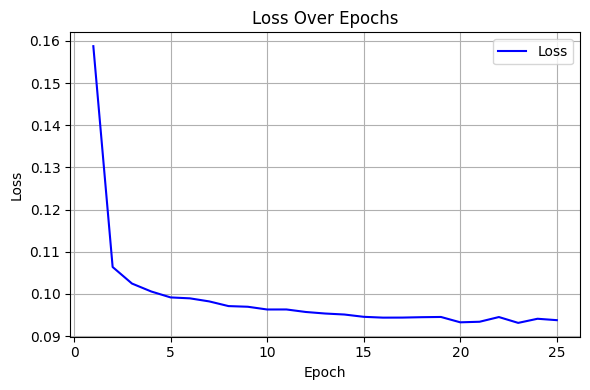

In [15]:
train(
    num_epochs=25,
    dataloader=cifar10_loader,
    model=model,
    optimizer=optimizer,
    checkpoint_dir="checkpoints",
    device = device
)

In [16]:
# Save model weights
torch.save(model.state_dict(), "trained/cifar_VP_unconditioned.pth")

#### Generation - Deterministic

In [ ]:
model.load_state_dict(torch.load("trained/cifar_VP_unconditioned.pth"))

<All keys matched successfully>

In [17]:
from tqdm import tqdm

def score_fn(model, x, t_norm):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 3, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)


            # Get the score (using the noise-predicting network)
            score = score_fn(model, xt, t_batch)

            # Euler–Maruyama update:
            xt = xt + (f - (g**2) * score / 2) * dt


            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 1000/1000 [00:24<00:00, 40.36it/s]
<ipython-input-18-1911ed0c4be2>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


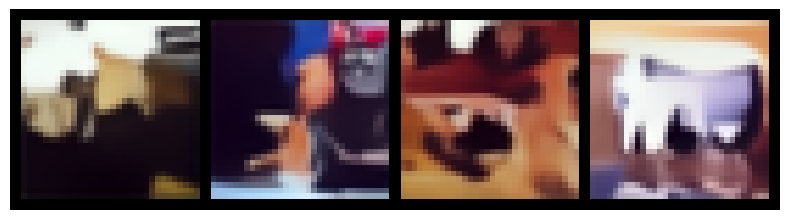

In [18]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=4,
    reverse_steps=1000,
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 500/500 [00:12<00:00, 40.28it/s]


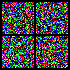

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=4,
    reverse_steps=500,
    schedule='linear',
    T=1,
    gif=True
)

frames = []
for _, x_t in enumerate(samples):
    frame = make_grid(x_t, nrow=2, padding=2).permute(1, 2, 0).cpu().numpy()
    frame = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    frames.append(Image.fromarray(frame))

# Create GIF
buf = io.BytesIO()
frames[0].save(buf, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)
buf.seek(0)

# # Save GIF locally
# output_path = "unconditioned.gif"
# frames[0].save(output_path, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

#### Evaluation - Stochastic

In [ ]:
model.load_state_dict(torch.load("trained/VP_unconditioned.pth"))

In [19]:
from tqdm import tqdm

def score_fn(model, x, t_norm):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 3, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)


            # Get the score (using the noise-predicting network)
            score = score_fn(model, xt, t_batch)

            # Euler–Maruyama update:
            #   x = x + [f - g^2 * score] dt + g * sqrt(-dt) * z,   where z ~ N(0, I)
            z = torch.randn_like(xt)

            xt = xt + (f - (g**2) * score) * dt + g * torch.sqrt(-dt) * z

            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 1000/1000 [02:18<00:00,  7.23it/s]
<ipython-input-23-8682b4e85760>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


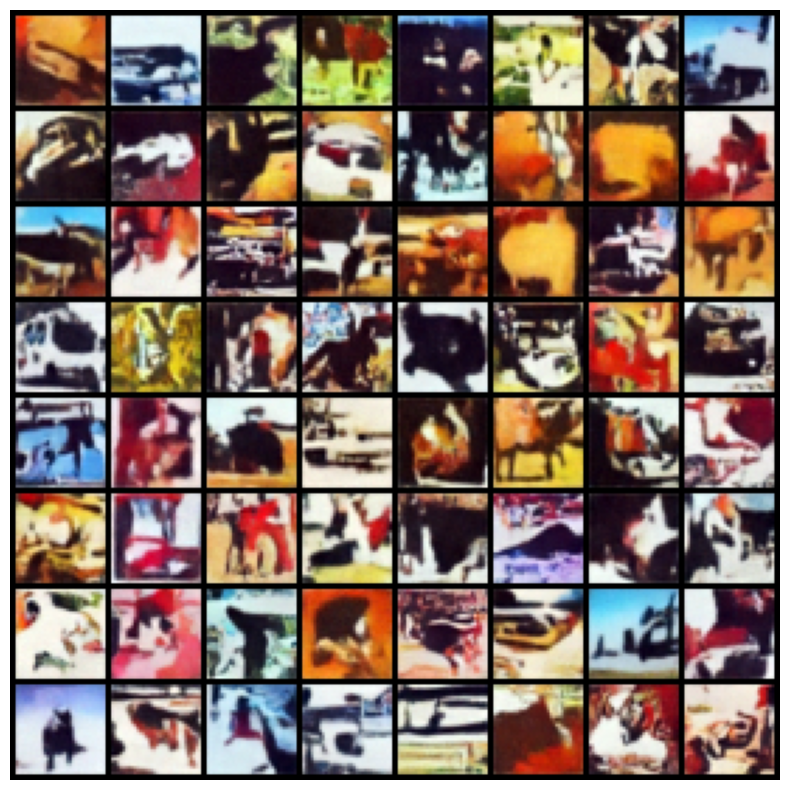

In [23]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=1000,
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.clamp(0,1).permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=4,
    reverse_steps=500,
    schedule='linear',
    T=1,
    gif=True
)

# final_step_images = [s[-1].cpu().detach().numpy() for s in samples]

frames = []
for _, x_t in enumerate(samples):
    frame = make_grid(x_t, nrow=2, padding=2).permute(1, 2, 0).cpu().numpy()
    frame = (np.clip(frame, 0, 1) * 255).astype(np.uint8)
    frames.append(Image.fromarray(frame))

# Create GIF
buf = io.BytesIO()
frames[0].save(buf, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)
buf.seek(0)

# # Save GIF locally
# output_path = "unconditioned.gif"
# frames[0].save(output_path, format="GIF", append_images=frames[1:], save_all=True, duration=20, loop=0)

# Display GIF
display(IPImage(buf.read(), width=512, height=512))

### Conditional

#### Training

In [ ]:
import math

def match_last_dims(data, shape):
    """
    Repeat a 1D tensor so that its last dimensions [1:] match `size[1:]`.
    Useful for working with batched data.
    """
    assert len(data.shape) == 1, "Data must be 1-dimensional (one value per batch)"
    for _ in range(len(shape) - 1):
        data = data.unsqueeze(-1)
    return data.repeat(1, *(shape[1:]))

def compute_beta_t(t_norm, T, schedule = 'linear'):
    # Compute β(t) depending on schedule.
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        beta_t = beta_min + t_norm * (beta_max - beta_min)
    elif schedule == 'cosine':
        s = 0.008
        beta_t = (torch.pi / (T * (1 + s))) * torch.tan(((t_norm + s) / (1 + s)) * (torch.pi / 2))
    else:
        raise ValueError('Unknown schedule')
    return beta_t

def compute_alpha_bar(t_norm, schedule = 'linear'):
    if schedule == 'linear':
        beta_min = 0.1
        beta_max = 20.0
        integrated_beta = beta_min * t_norm + 0.5 * (beta_max - beta_min) * t_norm**2
        alpha_bar = torch.exp(-  integrated_beta)
    elif schedule == 'cosine':
        alpha_bar = 0.5 * (1 - torch.cos(t_norm * torch.pi))
        s = 0.008
        alpha_bar = torch.cos((t_norm + s) / (1 + s) * (torch.pi / 2))**2
    else:
        raise ValueError('Unknown schedule')
    return alpha_bar

# must return x_t and the added noise, we will need it later to compute the loss
def forward(x_start, t, T, schedule = 'linear'):
    t_norm = t / T
    alpha_bar = compute_alpha_bar(t_norm, schedule)
    # expand alpha_bar to the same shape as x_start, so that we can multiply them
    alpha_bar = match_last_dims(alpha_bar, x_start.shape)
    noise = torch.randn_like(x_start)
    x_t = torch.sqrt(alpha_bar)*x_start + torch.sqrt(1 - alpha_bar)*noise
    return x_t, noise

In [ ]:
import torch.nn.functional as F

def noise_loss(model, x_start, T, y):
    x_start = x_start.to(device)
    batch_size = x_start.shape[0]
    # Sample t uniformly from [0, T]
    t = torch.rand(batch_size, device=device) * T
    x_t, noise = forward(x_start, t, T)
    # The model takes x_t and t as input and predicts the noise. time t should be of shape (batch_size, 1)
    # we can pass normalized time to model as input
    t_norm = t / T

    predicted_noise = model(x_t, t_norm, y=y)
    loss = F.mse_loss(predicted_noise, noise)
    return loss

In [ ]:
from utils.unet import UNetModel

channels = 3
out_channels = 3

first_layer_embedding = False
embedding_dim = 3 # MD4 needs a value for masks, so set of values is {0, 1, 2}
output_dim = 1 # We only output a single probability value

model = UNetModel(
        in_channels=channels,
        model_channels=32,
        out_channels= out_channels,
        num_res_blocks=2,
        attention_resolutions= [2, 4],
        dropout= 0.0,
        channel_mult= [1, 2, 2, 2], # divides image_size by two at each new item, except first one. [i] * model_channels
        dims = 2, # for images
        num_classes= 10,#
        num_heads=4,
        num_heads_upsample=-1, # same as num_heads
        use_scale_shift_norm=True,
        first_layer_embedding=first_layer_embedding,
        embedding_dim= embedding_dim,
        output_dim = output_dim,
    )

model = model.to(device)

In [ ]:
# setting up the optimizer
import torch.optim as optim

optimizer = optim.AdamW(
    model.parameters(),
    lr=2e-3,
    betas=(0.9, 0.999))

In [ ]:
import os

def train(num_epochs, dataloader, model, optimizer, checkpoint_dir, device, T = 1):
    print("Training on device:", device)

    # Set the model to training mode.
    model.train()

    epoch_losses = []
    for epoch in (range(1, num_epochs + 1)):

        running_loss = 0.0

        for batch_idx, (data, y) in (enumerate(dataloader)):
            data = data.to(device)
            y = y.to(device)
            optimizer.zero_grad()

            # Compute the training loss.
            loss = noise_loss(model, x_start=data, T=T, y=y.int())
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloader)
        epoch_losses.append(avg_loss)
        print(f"Epoch [{epoch}] Average Loss: {avg_loss:.4f}")

    print("Training finished.")

    # Save the losses to a file
    loss_path = os.path.join(checkpoint_dir, "cifar_VP_conditioned.pt")
    torch.save(epoch_losses, loss_path)
    print(f"Saved losses to: {loss_path}")

    # Plotting the loss
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, num_epochs + 1), epoch_losses, label="Loss", color="blue")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Over Epochs")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Training on device: cuda
Epoch [1] Average Loss: 0.0364
Epoch [2] Average Loss: 0.0222
Epoch [3] Average Loss: 0.0215
Epoch [4] Average Loss: 0.0208
Epoch [5] Average Loss: 0.0203
Epoch [6] Average Loss: 0.0203
Epoch [7] Average Loss: 0.0197
Epoch [8] Average Loss: 0.0194
Epoch [9] Average Loss: 0.0197
Epoch [10] Average Loss: 0.0196
Epoch [11] Average Loss: 0.0192
Epoch [12] Average Loss: 0.0193
Epoch [13] Average Loss: 0.0193
Epoch [14] Average Loss: 0.0192
Epoch [15] Average Loss: 0.0189
Epoch [16] Average Loss: 0.0190
Epoch [17] Average Loss: 0.0189
Epoch [18] Average Loss: 0.0187
Epoch [19] Average Loss: 0.0189
Epoch [20] Average Loss: 0.0187
Epoch [21] Average Loss: 0.0183
Epoch [22] Average Loss: 0.0186
Epoch [23] Average Loss: 0.0187
Epoch [24] Average Loss: 0.0185
Epoch [25] Average Loss: 0.0187
Epoch [26] Average Loss: 0.0185
Epoch [27] Average Loss: 0.0185
Epoch [28] Average Loss: 0.0182
Epoch [29] Average Loss: 0.0183
Epoch [30] Average Loss: 0.0183
Epoch [31] Average Loss:

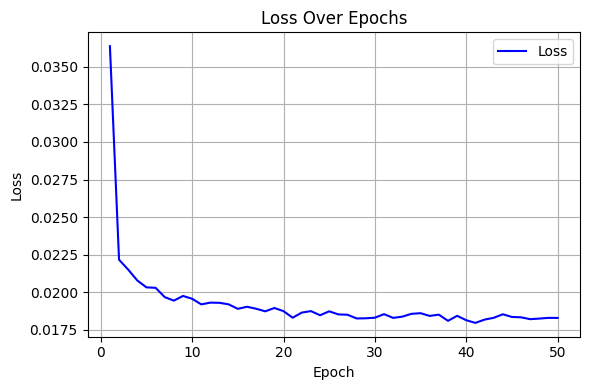

In [ ]:
train(
    num_epochs=50,
    dataloader=cifar10_loader,
    model=model,
    optimizer=optimizer,
    checkpoint_dir="checkpoints",
    device = device
)

In [ ]:
# Save model weights
torch.save(model.state_dict(), "trained/cifar_VP_conditioned.pth")

#### Evaluation - Deterministic

In [ ]:
model.load_state_dict(torch.load("trained/cifar_VP_conditioned.pth"))

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm, y):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm, y)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, class_label, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 3, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)

            # Compute conditional score
            cond_class_label = torch.full((shape[0],), class_label, device=device)
            score_cond = score_fn(model, xt, t_batch, cond_class_label)

            # Euler–Maruyama update:
            xt = xt + (f - (g**2) * score_cond / 2) * dt

            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 500/500 [00:21<00:00, 23.34it/s]
<ipython-input-14-9043f8f42f73>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


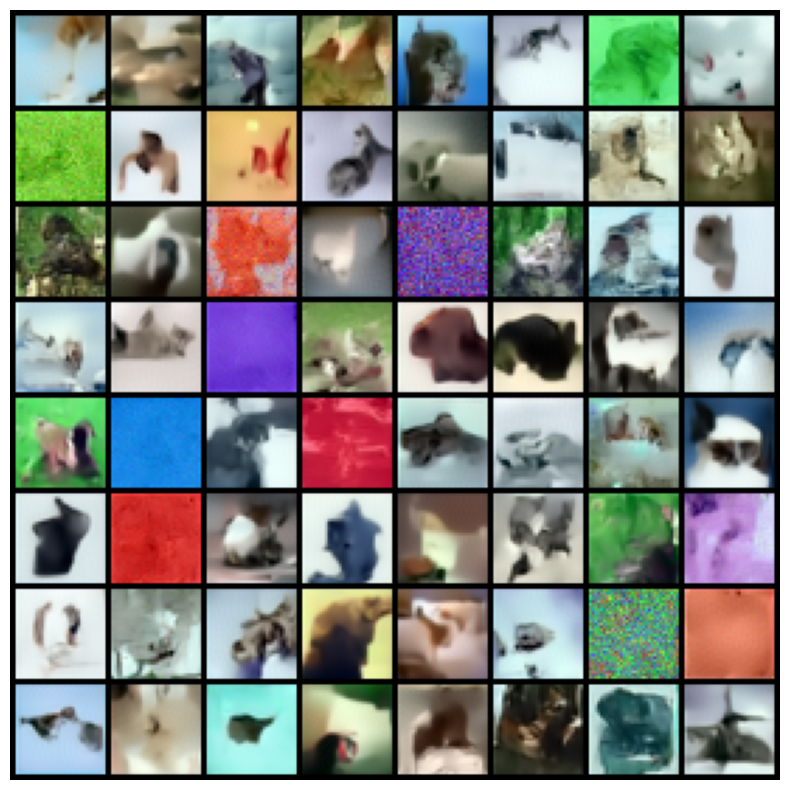

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=500,
    class_label=3,
    schedule='linear',
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 500/500 [00:12<00:00, 40.25it/s]
<ipython-input-15-9ccb118f2eb2>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
100%|██████████| 500/500 [00:11<00:00, 42.17it/s]


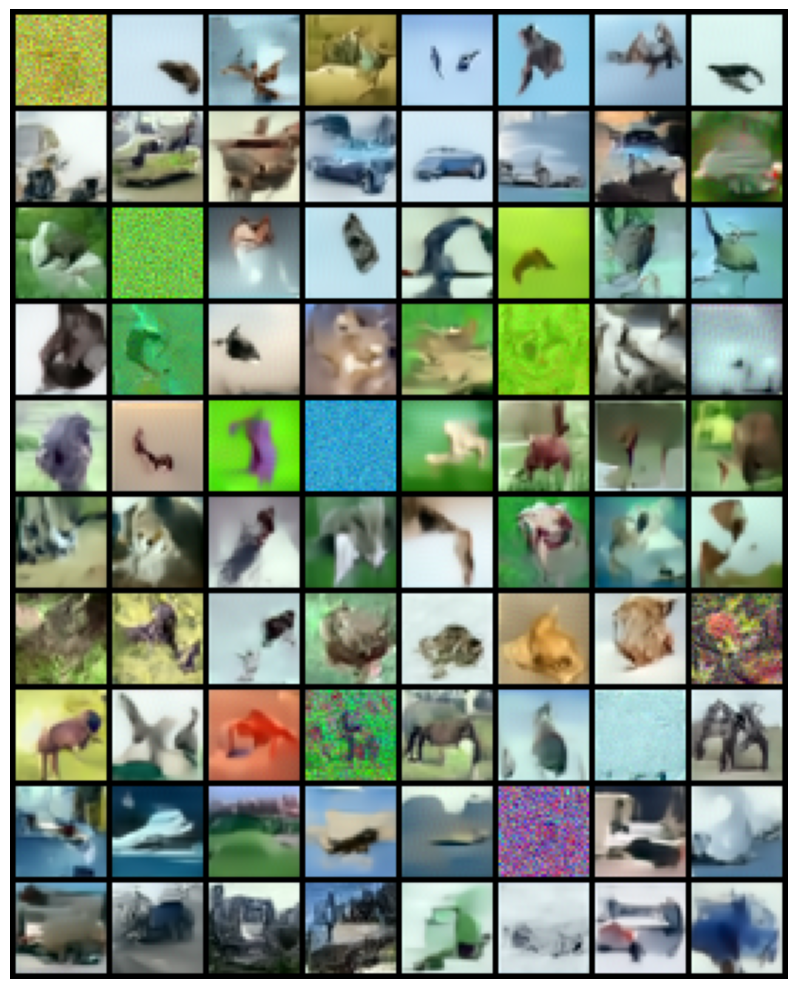

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Initialize an empty list to store all samples
all_samples = []

# Loop over digit classes 0 through 9
for class_label in range(10):
    samples = sample(
        model=model,
        n_samples=8,
        reverse_steps=500,
        class_label=class_label,
        T=1,
        gif=False
    )

    # Stack and collect final step images
    final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
    all_samples.append(final_step_images)

# Concatenate all class sample tensors into one tensor of shape (10 * n_samples, C, H, W)
all_samples_tensor = torch.cat(all_samples, dim=0)

# Create a grid with 8 rows and 10 columns
grid = make_grid(all_samples_tensor, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(12, 10))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 50/50 [00:03<00:00, 16.16it/s]
<ipython-input-17-ce49a44cbfb5>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sampled_images.append(torch.tensor(sample_result[0]).cpu())
100%|██████████| 500/500 [00:11<00:00, 42.98it/s]


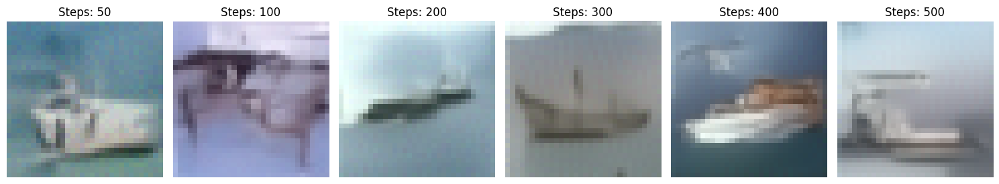

In [ ]:
import matplotlib.pyplot as plt
import torch

# List of steps at which to sample
steps_list = [50, 100, 200, 300, 400, 500]

# Collect one sample for each specified step count
sampled_images = []
for steps in steps_list:
    sample_result = sample(
        model=model,
        n_samples=1,
        reverse_steps=steps,
        class_label=8,
        T=1,
        gif=False
    )
    # Assume sample returns a list of numpy arrays or tensors
    sampled_images.append(torch.tensor(sample_result[0]).cpu())

# Plot each image individually
plt.figure(figsize=(15, 3))
for idx, image in enumerate(sampled_images):
    plt.subplot(1, len(steps_list), idx + 1)
    plt.imshow(image.permute(1,2,0).squeeze())
    plt.title(f'Steps: {steps_list[idx]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

#### Evaluation - Stochastic

In [ ]:
model.load_state_dict(torch.load("trained/cifar_VP_conditioned.pth"))

In [ ]:
from tqdm import tqdm

def score_fn(model, x, t_norm, y):
    """
    Given the noise-predicting model, returns the score (i.e. ∇_x log p_t(x))
    at actual time t. Note that the model expects a normalized time (t/T).
    For VP: score = - (predicted noise) / sqrt(1 - ᾱ(t))
    """

    alpha_bar = compute_alpha_bar(t_norm).view(-1, *([1] * (x.dim() - 1)))
    epsilon = model(x, t_norm, y)
    score = - epsilon / torch.sqrt(1 - alpha_bar)
    return score

def sample(model, n_samples, reverse_steps, class_label, schedule = 'linear', T = 1, gif = False):
    shape = (n_samples, 3, 32, 32)
    xt = torch.randn(shape, device=device)
    all_images = []
    model.eval()
    with torch.inference_mode():
        # Create a time discretization from T to 0
        t_seq = torch.linspace(T, 0, reverse_steps + 1, device=device)
        for i in tqdm(range(reverse_steps)):
            t_current = t_seq[i]
            t_next = t_seq[i + 1]
            dt = t_next - t_current  # dt is negative (reverse time)
            # Create a batch of current time values for the update.
            t_batch = torch.full((shape[0],), t_current, device=device)
            t_norm_batch = t_batch / T


            beta_t = compute_beta_t(t_norm_batch, T, schedule)
            beta_t = beta_t.view(-1, *([1] * (xt.dim() - 1)))


            f = -0.5 * beta_t * xt
            g = torch.sqrt(beta_t)

            # Compute conditional score
            cond_class_label = torch.full((shape[0],), class_label, device=device)
            score_cond = score_fn(model, xt, t_batch, cond_class_label)

            # Euler–Maruyama update:
            #   x = x + [f - g^2 * score] dt + g * sqrt(-dt) * z,   where z ~ N(0, I)
            z = torch.randn_like(xt)

            xt = xt + (f - (g**2) * score_cond) * dt + g * torch.sqrt(-dt) * z

            all_images.append(xt)

    return xt if not gif else all_images

100%|██████████| 500/500 [00:24<00:00, 20.68it/s]
<ipython-input-19-9043f8f42f73>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])


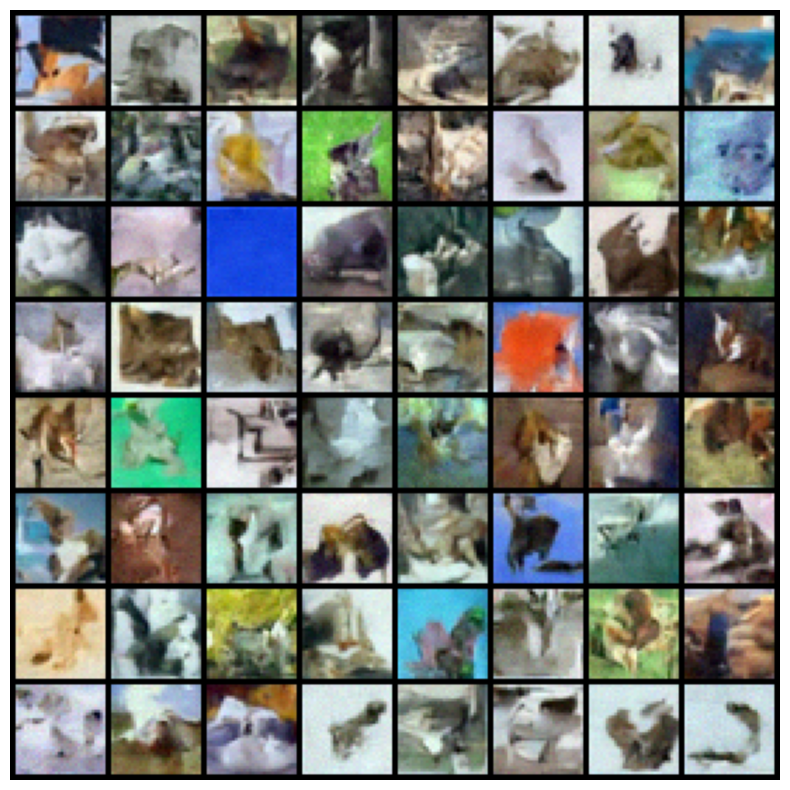

In [ ]:
from torchvision.utils import make_grid

samples = sample(
    model=model,
    n_samples=64,
    reverse_steps=500,
    class_label=3,
    schedule='linear',
    T=1,
    gif=False
)

# Stack the final images into a tensor
final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])

# Create an 8x8 grid
grid = make_grid(final_step_images, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 500/500 [00:11<00:00, 42.00it/s]
<ipython-input-20-f1265acc0faa>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
100%|██████████| 500/500 [00:11<00:00, 42.10it/s]


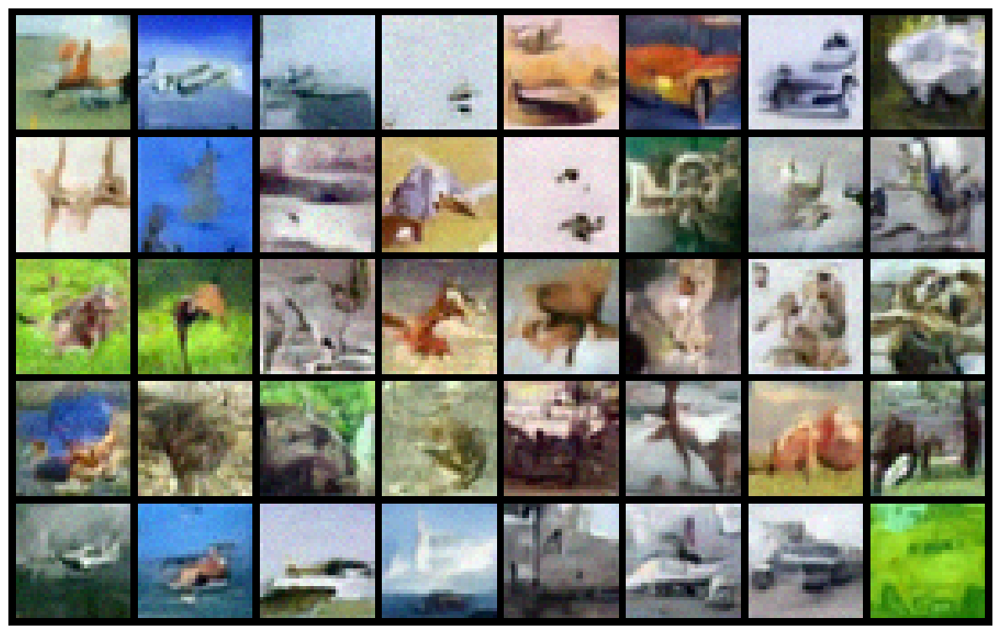

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Initialize an empty list to store all samples
all_samples = []

# Loop over digit classes 0 through 9
for class_label in range(10):
    samples = sample(
        model=model,
        n_samples=4,
        reverse_steps=500,
        class_label=class_label,
        T=1,
        gif=False
    )

    # Stack and collect final step images
    final_step_images = torch.stack([torch.tensor(s).cpu() for s in samples])
    all_samples.append(final_step_images)

# Concatenate all class sample tensors into one tensor of shape (10 * n_sample, C, H, W)
all_samples_tensor = torch.cat(all_samples, dim=0)

# Create a grid with 8 rows and 10 columns
grid = make_grid(all_samples_tensor, nrow=8, normalize=True, scale_each=True)

# Plot the grid
plt.figure(figsize=(12, 10))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.tight_layout()
plt.show()

100%|██████████| 50/50 [00:04<00:00, 10.94it/s]
<ipython-input-22-ce49a44cbfb5>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sampled_images.append(torch.tensor(sample_result[0]).cpu())
100%|██████████| 500/500 [00:11<00:00, 44.82it/s]


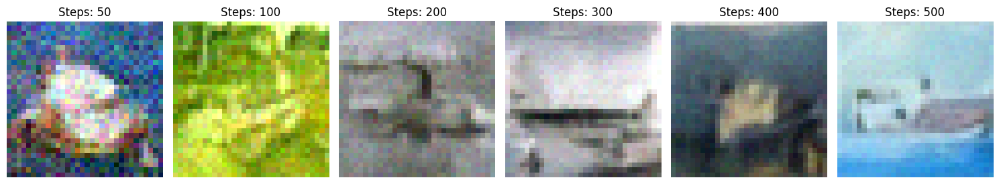

In [ ]:
import matplotlib.pyplot as plt
import torch

# List of steps at which to sample
steps_list = [50, 100, 200, 300, 400, 500]

# Collect one sample for each specified step count
sampled_images = []
for steps in steps_list:
    sample_result = sample(
        model=model,
        n_samples=1,
        reverse_steps=steps,
        class_label=8,
        T=1,
        gif=False
    )
    # Assume sample returns a list of numpy arrays or tensors
    sampled_images.append(torch.tensor(sample_result[0]).cpu())

# Plot each image individually
plt.figure(figsize=(15, 3))
for idx, image in enumerate(sampled_images):
    plt.subplot(1, len(steps_list), idx + 1)
    plt.imshow(image.permute(1,2,0).squeeze())
    plt.title(f'Steps: {steps_list[idx]}')
    plt.axis('off')
plt.tight_layout()
plt.show()